# Part A
**CONTEXT:** A communications equipment manufacturing company has a product which is responsible for emitting informative signals. Company wants to build a machine learning model which can help the company to predict the equipment’s signal quality using various parameters.

**DATA DESCRIPTION:** The data set contains information on various signal tests performed:
1. Parameters: Various measurable signal parameters.
2. Signal_Quality: Final signal strength or quality

**PROJECT OBJECTIVE:** To build a classifier which can use the given parameters to determine the signal strength or quality.


## Q1. Data import and Understanding


### A. Read the ‘Signals.csv’ as DataFrame and import required libraries.

In [1]:
# Import Libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.model_selection import train_test_split

# Ignore Warnings
#import warnings
#warnings.filterwarnings("ignore")


In [2]:
# from google.colab import drive
# drive.mount('/content/drive',force_remount=True)


# Read the csv file and store in a dataframe
# data = pd.read_csv('/content/drive/My Drive/PGP: AIML University Of Texas/Assignment - Introduction to Neural Networks/NN Project Data - Signal.csv')
data = pd.read_csv('NN Project Data - Signal.csv')
# Show data header
data.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Parameter 1      1599 non-null   float64
 1   Parameter 2      1599 non-null   float64
 2   Parameter 3      1599 non-null   float64
 3   Parameter 4      1599 non-null   float64
 4   Parameter 5      1599 non-null   float64
 5   Parameter 6      1599 non-null   float64
 6   Parameter 7      1599 non-null   float64
 7   Parameter 8      1599 non-null   float64
 8   Parameter 9      1599 non-null   float64
 9   Parameter 10     1599 non-null   float64
 10  Parameter 11     1599 non-null   float64
 11  Signal_Strength  1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


### B. Check for missing values and print percentage for each attribute.

In [4]:
# Check for missing values
data.isnull().sum()

Parameter 1        0
Parameter 2        0
Parameter 3        0
Parameter 4        0
Parameter 5        0
Parameter 6        0
Parameter 7        0
Parameter 8        0
Parameter 9        0
Parameter 10       0
Parameter 11       0
Signal_Strength    0
dtype: int64

In [5]:
# Check for missing values percentage
data.isnull().sum()*100/len(data)

Parameter 1        0.0
Parameter 2        0.0
Parameter 3        0.0
Parameter 4        0.0
Parameter 5        0.0
Parameter 6        0.0
Parameter 7        0.0
Parameter 8        0.0
Parameter 9        0.0
Parameter 10       0.0
Parameter 11       0.0
Signal_Strength    0.0
dtype: float64

### C. Check for presence of duplicate records in the dataset and impute with appropriate method.

In [6]:
# Checking duplicate rows in the dataframe
data[data.duplicated()]

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
11,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.5,5
27,7.9,0.430,0.21,1.60,0.106,10.0,37.0,0.99660,3.17,0.91,9.5,5
40,7.3,0.450,0.36,5.90,0.074,12.0,87.0,0.99780,3.33,0.83,10.5,5
65,7.2,0.725,0.05,4.65,0.086,4.0,11.0,0.99620,3.41,0.39,10.9,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1563,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1564,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1567,7.2,0.695,0.13,2.00,0.076,12.0,20.0,0.99546,3.29,0.54,10.1,5
1581,6.2,0.560,0.09,1.70,0.053,24.0,32.0,0.99402,3.54,0.60,11.3,5


In [7]:
# dropping and checking again duplicate values
data.drop_duplicates(keep=False,inplace=True)
data[data.duplicated()]

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11,Signal_Strength


### D. Visualise distribution of the target variable - **Signal_Strength**.

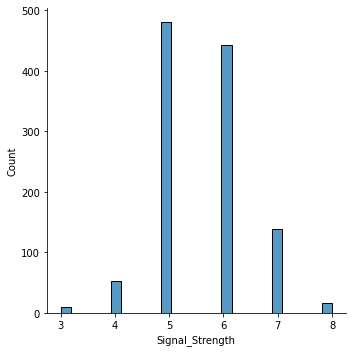

In [8]:
sns.displot(data['Signal_Strength']);

C:\Users\harit\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


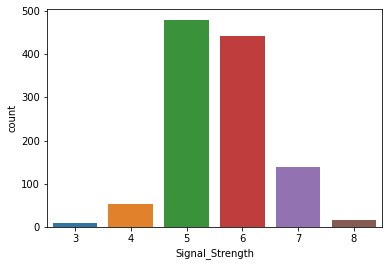

In [9]:
sns.countplot(data['Signal_Strength']);

C:\Users\harit\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


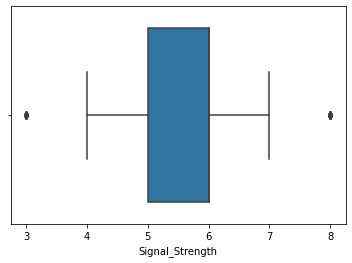

In [10]:
sns.boxplot(data['Signal_Strength']);

### E. Share insights from the initial data analysis (at least 2).

In [11]:
# Install and Import Required Library
!pip install ydata-profiling
from ydata_profiling import ProfileReport

# Generate Data Profile Report
profile = ProfileReport(data, title="Equipment Signal Quality Analysis")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Dataset Overview

#### 1. Correlation:
- Multiple parameters show **high correlation**, indicating potential redundancy.
- Parameter 1 and 9 are highly correlated (negatively).

#### 2. Zero-Value Distribution:
- **Parameter 3** has **9.3% zero values**, which could impact analysis.
- Other parameters have **no zeros**, meaning all recorded values are meaningful.

#### 3. Parameter Distribution:
- **Parameter 8** has the **highest distinct values (400 out of 1139, ~35.1%)**, showing high variability.
- **Signal Strength** has only **6 distinct values (~0.5%)**, suggesting possible categorical nature.

#### 4. Value Ranges:
- **Parameter 6 (Min: 1, Max: 72)** and **Parameter 7 (Min: 6, Max: 289)** show wide spreads, indicating high variance.
- **Parameter 8 (Min: 0.9902, Max: 1.0032)** has a very **narrow range**, possibly less impactful for modeling.



## Q2. Data preprocessing

### A. Split the data into X & Y.

In [12]:
# Let independent variables be all the parameters
x_DataSet = data.drop(columns='Signal_Strength', axis=1)
x_DataSet.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
5,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4
6,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4


In [13]:
y_DataSet = data['Signal_Strength']
y_DataSet

1       5
2       5
3       6
5       5
6       5
       ..
1593    6
1594    5
1595    6
1597    5
1598    6
Name: Signal_Strength, Length: 1139, dtype: int64

### B. Split the data into train & test with 70:30 proportion.

In [14]:
X_train, X_test, y_train, y_test = train_test_split(x_DataSet, y_DataSet, test_size=0.3, random_state=1)

X_train.head()

,Parameter 1,Parameter 2,Parameter 3,Parameter 4,Parameter 5,Parameter 6,Parameter 7,Parameter 8,Parameter 9,Parameter 10,Parameter 11
525,10.4,0.64,0.24,2.8,0.105,29.0,53.0,0.99980,3.24,0.67,9.9
1004,8.2,0.43,0.29,1.6,0.081,27.0,45.0,0.99603,3.25,0.54,10.3
58,7.8,0.59,0.18,2.3,0.076,17.0,54.0,0.99750,3.43,0.59,10.0
1317,9.9,0.44,0.46,2.2,0.091,10.0,41.0,0.99638,3.18,0.69,11.9
894,7.2,0.63,0.03,2.2,0.080,17.0,88.0,0.99745,3.53,0.58,9.8


### C. Print shape of all the 4 variables and verify if train and test data is in sync.

In [15]:
print('Shape of Train Data of Independent Variables:',X_train.shape)
print('Shape of Train Data of Target Variables:',y_train.shape)
print('Shape of Test Data of Independent Variables:',X_test.shape)
print('Shape of Test Data of Target Variables:',y_test.shape)

Shape of Train Data of Independent Variables: (797, 11)
Shape of Train Data of Target Variables: (797,)
Shape of Test Data of Independent Variables: (342, 11)
Shape of Test Data of Target Variables: (342,)


### D. Normalise the train and test data with appropriate method.

In [16]:
# Import necessary module
from sklearn.preprocessing import MinMaxScaler

# Initialize the MinMaxScaler
scaler = MinMaxScaler()

# Apply scaling to the training data
X_train_scaled = scaler.fit_transform(X_train)

# Display the transformed data
X_train_scaled

array([[0.51327434, 0.41025641, 0.30379747, ..., 0.33043478, 0.20606061,
        0.23076923],
       [0.31858407, 0.23076923, 0.36708861, ..., 0.33913043, 0.12727273,
        0.29230769],
       [0.28318584, 0.36752137, 0.2278481 , ..., 0.49565217, 0.15757576,
        0.24615385],
       ...,
       [0.57522124, 0.23931624, 0.53164557, ..., 0.33913043, 0.14545455,
        0.30769231],
       [0.3539823 , 0.26495726, 0.37974684, ..., 0.3826087 , 0.12121212,
        0.15384615],
       [0.23893805, 0.36324786, 0.2278481 , ..., 0.39130435, 0.12727273,
        0.21538462]])

In [17]:
# Scale the test dataset using the fitted scaler
X_test_scaled = scaler.transform(X_test)

# Output the scaled test data
X_test_scaled

array([[0.34513274, 0.23931624, 0.63291139, ..., 0.13043478, 0.46666667,
        0.15384615],
       [0.24778761, 0.16239316, 0.41772152, ..., 0.43478261, 0.16363636,
        0.53846154],
       [0.48672566, 0.09401709, 0.6835443 , ..., 0.26956522, 0.12121212,
        0.63076923],
       ...,
       [0.21238938, 0.23076923, 0.02531646, ..., 0.42608696, 0.29090909,
        0.33846154],
       [0.20353982, 0.24786325, 0.13924051, ..., 0.3826087 , 0.19393939,
        0.46153846],
       [0.36283186, 0.51709402, 0.27848101, ..., 0.20869565, 0.13333333,
        0.15384615]])

### E. Transform Labels into format acceptable by Neural Network

In [18]:
# Retrieve unique values of the target variable 'Signal_Strength'
unique_values = y_DataSet.unique()

# Display unique values
unique_values

array([5, 6, 7, 4, 8, 3], dtype=int64)

In [19]:
# Get the unique values present in the training target variable
unique_train_values = y_train.unique()

# Display the unique values
unique_train_values


array([5, 6, 7, 3, 4, 8], dtype=int64)

In [20]:
# Import necessary module for one-hot encoding
from keras.utils import to_categorical

# Convert integer labels into one-hot encoded format
y_train_one_hot = to_categorical(y_train)

# Display the transformed labels
y_train_one_hot


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [21]:
# Print an example label from the training set
print("Original Label:", y_train.iloc[1])

# Print the corresponding one-hot encoded label
print("One-Hot Encoded:", y_train_one_hot[0])


Original Label: 5
One-Hot Encoded: [0. 0. 0. 0. 0. 1. 0. 0. 0.]


In [22]:
# Display unique values in the test target variable
print("Unique values in y_test:", y_test.unique())


Unique values in y_test: [5 6 7 8 4 3]


In [23]:
  # Convert test target labels into one-hot encoded format
dummy_y_test = to_categorical(y_test)

# Display the transformed labels
dummy_y_test


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [24]:
print(dummy_y_test[0])


[0. 0. 0. 0. 0. 1. 0. 0. 0.]


In [25]:
X_train_scaled.shape


(797, 11)

## Q3. Model Training & Evaluation using Neural Network

### A. Design a Neural Network to train a classifier.

In [26]:
# Import necessary modules
import tensorflow as tf
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import SGD
from sklearn.metrics import (
    accuracy_score, confusion_matrix, precision_score,
    recall_score, f1_score, precision_recall_curve, auc
)

# Initialize the neural network
model = Sequential()

# Input layer with 11 features and 10 neurons
model.add(Dense(units=10, activation='relu', kernel_initializer='he_uniform', input_shape=(11,)))

# Hidden layer with 10 neurons and sigmoid activation
model.add(Dense(units=10, activation='sigmoid', kernel_initializer='glorot_uniform'))

# Output layer with 9 neurons for classification
model.add(Dense(units=9, activation='softmax', kernel_initializer='glorot_uniform'))

# Compile the model using SGD optimizer and categorical crossentropy loss
model.compile(optimizer=SGD(), loss='categorical_crossentropy', metrics=['accuracy'])

# Display model architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 10)                120       
                                                                 
 dense_1 (Dense)             (None, 10)                110       
                                                                 
 dense_2 (Dense)             (None, 9)                 99        
                                                                 
Total params: 329
Trainable params: 329
Non-trainable params: 0
_________________________________________________________________


### B. Train the classifier using previously designed Architecture

In [27]:
# Train the model
training_model = model.fit(
    X_train_scaled, y_train_one_hot,
    validation_data=(X_test_scaled, dummy_y_test),
    epochs=100,
    batch_size=32,
    verbose=1
)


Epoch 1/100
25/25 [==============================] - 1s 10ms/step - loss: 2.5280 - accuracy: 0.0000e+00 - val_loss: 2.3804 - val_accuracy: 0.0000e+00
Epoch 2/100
25/25 [==============================] - 0s 3ms/step - loss: 2.2639 - accuracy: 0.0000e+00 - val_loss: 2.1444 - val_accuracy: 0.0000e+00
Epoch 3/100
25/25 [==============================] - 0s 3ms/step - loss: 2.0511 - accuracy: 0.1932 - val_loss: 1.9566 - val_accuracy: 0.4152
Epoch 4/100
25/25 [==============================] - 0s 3ms/step - loss: 1.8839 - accuracy: 0.4128 - val_loss: 1.8113 - val_accuracy: 0.4181
Epoch 5/100
25/25 [==============================] - 0s 3ms/step - loss: 1.7550 - accuracy: 0.4203 - val_loss: 1.7003 - val_accuracy: 0.4181
Epoch 6/100
25/25 [==============================] - 0s 3ms/step - loss: 1.6571 - accuracy: 0.4228 - val_loss: 1.6160 - val_accuracy: 0.4181
Epoch 7/100
25/25 [==============================] - 0s 3ms/step - loss: 1.5826 - accuracy: 0.4228 - val_loss: 1.5521 - val_accuracy: 0.4

25/25 [==============================] - 0s 3ms/step - loss: 1.2491 - accuracy: 0.4228 - val_loss: 1.2643 - val_accuracy: 0.4181
Epoch 59/100
25/25 [==============================] - 0s 2ms/step - loss: 1.2485 - accuracy: 0.4228 - val_loss: 1.2639 - val_accuracy: 0.4181
Epoch 60/100
25/25 [==============================] - 0s 2ms/step - loss: 1.2479 - accuracy: 0.4228 - val_loss: 1.2635 - val_accuracy: 0.4181
Epoch 61/100
25/25 [==============================] - 0s 3ms/step - loss: 1.2474 - accuracy: 0.4228 - val_loss: 1.2632 - val_accuracy: 0.4181
Epoch 62/100
25/25 [==============================] - 0s 2ms/step - loss: 1.2469 - accuracy: 0.4216 - val_loss: 1.2629 - val_accuracy: 0.4181
Epoch 63/100
25/25 [==============================] - 0s 3ms/step - loss: 1.2463 - accuracy: 0.4228 - val_loss: 1.2625 - val_accuracy: 0.4181
Epoch 64/100
25/25 [==============================] - 0s 2ms/step - loss: 1.2459 - accuracy: 0.4228 - val_loss: 1.2622 - val_accuracy: 0.4181
Epoch 65/100
25/25 

### C. Plot 2 separate visuals.

#### i. Training Loss and Validation Loss

In [28]:
# Display available metrics from training history
print(training_model.history.keys())


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


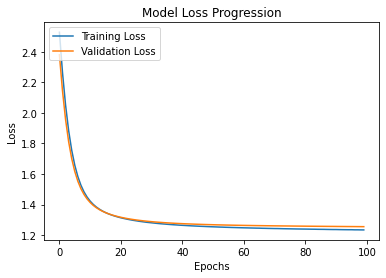

In [29]:
# Visualize training and validation loss over epochs
plt.plot(training_model.history['loss'], label='Training Loss')
plt.plot(training_model.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Progression')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()


#### ii. Training Accuracy and Validation Accuracy

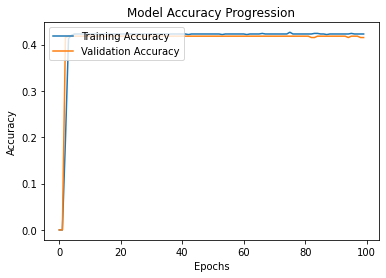

In [30]:
# Visualizing training and validation accuracy over epochs
plt.plot(training_model.history['accuracy'], label='Training Accuracy')
plt.plot(training_model.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Progression')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

### D. Design new architecture/update existing architecture in attempt to improve the performance of the model.

In [31]:
# Import necessary modules
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam

# Initialize the neural network model
classifier_model = Sequential()

# Input Layer with Batch Normalization and Dropout
classifier_model.add(Dense(units=9, activation='relu', input_dim=11, kernel_initializer='he_normal'))
classifier_model.add(BatchNormalization())
classifier_model.add(Dropout(0.1))

# Hidden Layer with Batch Normalization and Dropout
classifier_model.add(Dense(units=9, activation='relu', kernel_initializer='he_normal'))
classifier_model.add(BatchNormalization())
classifier_model.add(Dropout(0.1))

# Output Layer
classifier_model.add(Dense(units=9, activation='softmax', kernel_initializer='glorot_uniform'))

# Compile the model using Adam optimizer
classifier_model.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
classifier_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 9)                 108       
                                                                 
 batch_normalization (BatchN  (None, 9)                36        
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 9)                 0         
                                                                 
 dense_4 (Dense)             (None, 9)                 90        
                                                                 
 batch_normalization_1 (Batc  (None, 9)                36        
 hNormalization)                                                 
                                                                 
 dropout_1 (Dropout)         (None, 9)                

In [32]:
# Train the model
training_model = classifier_model.fit(
    X_train_scaled, y_train_one_hot,
    validation_data=(X_test_scaled, dummy_y_test),
    epochs=100, batch_size=32
)


Epoch 1/100
25/25 [==============================] - 1s 8ms/step - loss: 2.5086 - accuracy: 0.1267 - val_loss: 2.1554 - val_accuracy: 0.2456
Epoch 2/100
25/25 [==============================] - 0s 3ms/step - loss: 2.3237 - accuracy: 0.1656 - val_loss: 2.0609 - val_accuracy: 0.3713
Epoch 3/100
25/25 [==============================] - 0s 3ms/step - loss: 2.2216 - accuracy: 0.1844 - val_loss: 1.9854 - val_accuracy: 0.4357
Epoch 4/100
25/25 [==============================] - 0s 3ms/step - loss: 2.0855 - accuracy: 0.2547 - val_loss: 1.9057 - val_accuracy: 0.4971
Epoch 5/100
25/25 [==============================] - 0s 3ms/step - loss: 1.9362 - accuracy: 0.3199 - val_loss: 1.8281 - val_accuracy: 0.5088
Epoch 6/100
25/25 [==============================] - 0s 4ms/step - loss: 1.8862 - accuracy: 0.3538 - val_loss: 1.7551 - val_accuracy: 0.5263
Epoch 7/100
25/25 [==============================] - 0s 3ms/step - loss: 1.8169 - accuracy: 0.3952 - val_loss: 1.6852 - val_accuracy: 0.5380
Epoch 8/100
2

Epoch 59/100
25/25 [==============================] - 0s 3ms/step - loss: 1.0162 - accuracy: 0.5471 - val_loss: 1.0168 - val_accuracy: 0.6287
Epoch 60/100
25/25 [==============================] - 0s 3ms/step - loss: 0.9908 - accuracy: 0.5458 - val_loss: 1.0154 - val_accuracy: 0.6287
Epoch 61/100
25/25 [==============================] - 0s 3ms/step - loss: 0.9957 - accuracy: 0.5734 - val_loss: 1.0186 - val_accuracy: 0.6170
Epoch 62/100
25/25 [==============================] - 0s 2ms/step - loss: 0.9955 - accuracy: 0.5721 - val_loss: 1.0186 - val_accuracy: 0.6257
Epoch 63/100
25/25 [==============================] - 0s 3ms/step - loss: 1.0040 - accuracy: 0.5609 - val_loss: 1.0193 - val_accuracy: 0.6257
Epoch 64/100
25/25 [==============================] - 0s 3ms/step - loss: 1.0008 - accuracy: 0.5571 - val_loss: 1.0173 - val_accuracy: 0.6316
Epoch 65/100
25/25 [==============================] - 0s 4ms/step - loss: 1.0031 - accuracy: 0.5721 - val_loss: 1.0186 - val_accuracy: 0.6345
Epoch 

### E. Plot visuals as in Q3.C and share insights about difference observed in both the models.

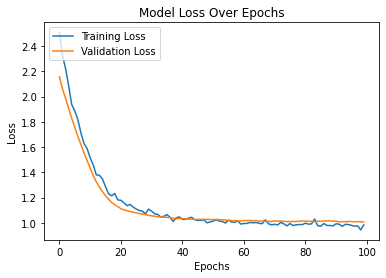

In [33]:
# Plot training vs validation loss
plt.plot(training_model.history['loss'], label='Training Loss')
plt.plot(training_model.history['val_loss'], label='Validation Loss')
plt.title('Model Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend(loc='upper left')
plt.show()

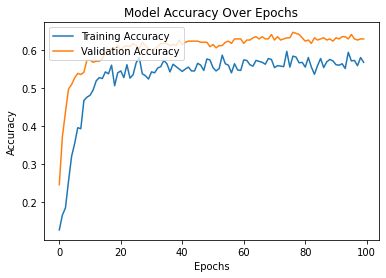

In [34]:
# Plot training vs validation accuracy
plt.plot(training_model.history['accuracy'], label='Training Accuracy')
plt.plot(training_model.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='upper left')
plt.show()

#### Key Observations
- Incorporating Batch Normalization and Dropout has led to a slight improvement in accuracy.  
- In the initial network, there is a significant disparity between training and test loss, exceeding a value of 1.  
- The revised network effectively reduces both losses, and the difference between training and test loss is minimal.  
- While the first model struggles with lower test accuracy, the refined model demonstrates better generalization, with test accuracy surpassing training accuracy.  


# Part B

**CONTEXT:** A Recognising multi-digit numbers in photographs captured at street level is an important component of modern-day map making. A classic example of a corpus of such street-level photographs is Google’s Street View imagery composed of hundreds of millions of geo-located 360-degree panoramic images.
The ability to automatically transcribe an address number from a geo-located patch of pixels and associate the transcribed number with a known street address helps pinpoint, with a high degree of accuracy, the location of the building it represents. More broadly, recognising numbers in photographs is a problem of interest to the optical character recognition community.
While OCR on constrained domains like document processing is well studied, arbitrary multi-character text recognition in photographs is still highly challenging. This difficulty arises due to the wide variability in the visual appearance of text in the wild on account of a large range of fonts, colours, styles, orientations, and character arrangements.
The recognition problem is further complicated by environmental factors such as lighting, shadows, specularity, and occlusions as well as by image acquisition factors such as resolution, motion, and focus blurs. In this project, we will use the dataset with images centred around a single digit (many of the images do contain some distractors at the sides). Although we are taking a sample of the data which is simpler, it is more complex than MNIST because of the distractors.

**DATA DESCRIPTION:** The SVHN is a real-world image dataset for developing machine learning and object recognition algorithms with the minimal requirement on data formatting but comes from a significantly harder, unsolved, real-world problem (recognising digits and numbers in natural scene images). SVHN is obtained from house numbers in Google Street View images.

**PROJECT OBJECTIVE:** To build a digit classifier on the SVHN (Street View Housing Number) dataset.

## Q1. Data Import and Exploration


### A. Read the .h5 file and assign to a variable.

In [35]:
# Required Library
import h5py

# Load the SVHN dataset from the HDF5 file
# svhn_data = h5py.File('/content/drive/My Drive/PGP: AIML University Of Texas/Assignment - Introduction to Neural Networks/Autonomous_Vehicles_SVHN_single_grey1.h5', 'r')
svhn_data = h5py.File('Autonomous_Vehicles_SVHN_single_grey1.h5', 'r')

# Display dataset structure
svhn_data

<HDF5 file "Autonomous_Vehicles_SVHN_single_grey1.h5" (mode r)>

### B. Print all the keys from the .h5 file.

In [36]:
# Retrieve keys from the HDF5 file
list(svhn_data.keys())

['X_test', 'X_train', 'X_val', 'y_test', 'y_train', 'y_val']

### C. Split the data into X_train, X_test, Y_train, Y_test

In [37]:
# Extract training and testing data from the HDF5 file
train_images = svhn_data['X_train'][:]
train_labels = svhn_data['y_train'][:]
test_images = svhn_data['X_test'][:]
test_labels = svhn_data['y_test'][:]

# Display training labels
train_labels

array([2, 6, 7, ..., 7, 0, 4], dtype=uint8)

## Q2. Data Visualisation and preprocessing

### A. Print shape of all the 4 data split into x, y, train, test to verify if x & y is in sync. 

In [38]:
# Print shape of the training and test sets
print(train_images.shape, train_labels.shape)
print(test_images.shape, test_labels.shape)


(42000, 32, 32) (42000,)
(18000, 32, 32) (18000,)


### B. Visualise first 10 images in train data and print its corresponding labels. 

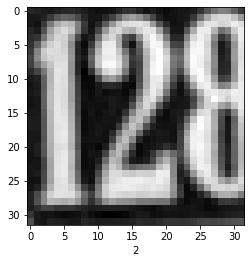

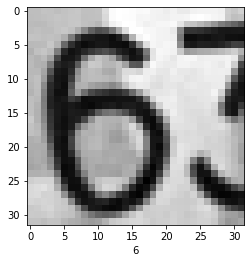

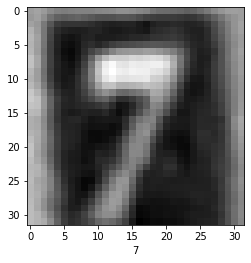

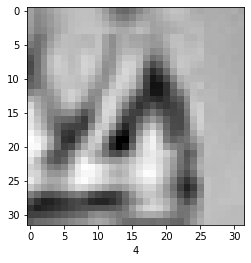

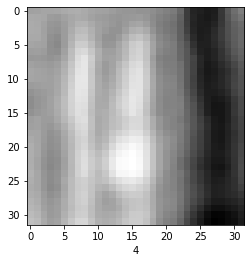

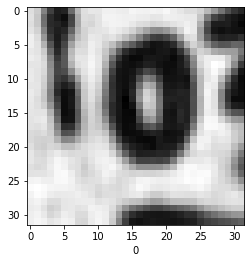

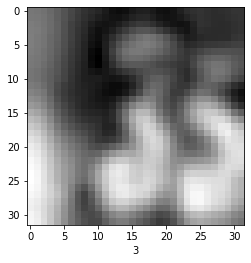

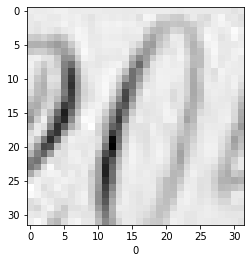

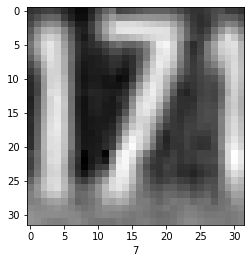

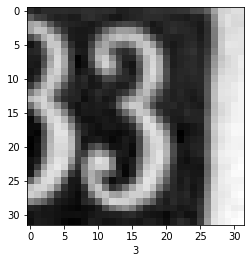

In [39]:
import matplotlib.pyplot as plt

# Display first 10 images with labels
for i in range(10):
    image = train_images[i]
    plt.figure(i)
    plt.imshow(image, cmap='gray')  # Ensure grayscale display
    plt.xlabel(str(train_labels[i]))  # Convert label to string if necessary
    plt.show()


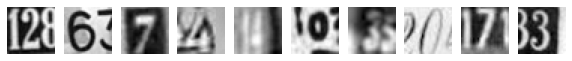

Labels for the above images: [2 6 7 4 4 0 3 0 7 3]


In [40]:
# Visualizing the first 10 images in the dataset and their labels
plt.figure(figsize=(10, 1))

for i in range(10):
    plt.subplot(1, 10, i + 1)
    plt.imshow(train_images[i], cmap='gray')  # Ensure grayscale display
    plt.axis('off')

plt.show()
print('Labels for the above images:', train_labels[:10])


### C. Reshape all the images with appropriate shape update the data in same variable.

In [41]:
# Shape of the images and the first image
print("Shape:", train_images[0].shape)
print()
print("First image:\n", train_images[0])


Shape: (32, 32)

First image:
 [[ 33.0704  30.2601  26.852  ...  71.4471  58.2204  42.9939]
 [ 25.2283  25.5533  29.9765 ... 113.0209 103.3639  84.2949]
 [ 26.2775  22.6137  40.4763 ... 113.3028 121.775  115.4228]
 ...
 [ 28.5502  36.212   45.0801 ...  24.1359  25.0927  26.0603]
 [ 38.4352  26.4733  23.2717 ...  28.1094  29.4683  30.0661]
 [ 50.2984  26.0773  24.0389 ...  49.6682  50.853   53.0377]]


In [42]:
# Reshaping the dataset to flatten them. Convert 2D images into 1D arrays
train_images = train_images.reshape(train_images.shape[0], -1)
test_images = test_images.reshape(test_images.shape[0], -1)

# Check Shape of the images and the first image
print("Shape:", train_images[0].shape)
print()
print("First image:\n", train_images[0])


Shape: (1024,)

First image:
 [33.0704 30.2601 26.852  ... 49.6682 50.853  53.0377]


In [43]:
print("train_images:", train_images.shape, " test_images:", test_images.shape, 
      " y_train:", train_labels.shape, " y_test:", test_labels.shape)

train_images: (42000, 1024)  test_images: (18000, 1024)  y_train: (42000,)  y_test: (18000,)


### D. Normalise the images i.e. Normalise the pixel values.

In [44]:
# Normalize inputs 
train_images = train_images / 255.0
test_images = test_images / 255.0

print("Max value in train_images:", train_images.max())
print("Min value in train_images:", train_images.min())

Max value in train_images: 0.9999
Min value in train_images: 0.0


### E. Transform Labels into format acceptable by Neural Network

In [45]:
# One-hot encode output labels
train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

print(train_labels.shape)
print(test_labels.shape)


(42000, 10)
(18000, 10)


### F. Print total Number of classes in the Dataset. 

In [46]:
print("Number of classes in train_labels:", train_labels.shape[1])
print("Number of classes in test_labels:", test_labels.shape[1])

Number of classes in train_labels: 10
Number of classes in test_labels: 10


## Q3. Model Training & Evaluation using Neural Network

### A. Design a Neural Network to train a classifier.

In [47]:
# Import necessary modules
from tensorflow.keras import losses, optimizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization

# Define the function to create the model
def build_neural_network():
    model = Sequential([
        Dense(256, activation='relu', input_shape=(1024,)),
        Dense(128, activation='relu'),
        Dropout(0.2),
        Dense(64, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        BatchNormalization(),
        Dense(10, activation='softmax')  
    ]) 
    
    # Initialize Adam optimizer with a specific learning rate
    adam_optimizer = optimizers.Adam(learning_rate=0.0005)
    
    # Compile the model with categorical cross-entropy loss and accuracy metric
    model.compile(optimizer=adam_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])
    
    return model

# Instantiate and summarize the model
model_v2 = build_neural_network()
model_v2.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 256)               262400    
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 64)                8256      
                                                                 
 dense_9 (Dense)             (None, 64)                4160      
                                                                 
 dense_10 (Dense)            (None, 32)                2080      
                                                                 
 batch_normalization_2 (Batc  (None, 32)              

### B. Train the classifier using previously designed Architecture 

In [48]:
# Train the model with updated variable names
history_v2 = model_v2.fit(
    train_images, train_labels,
    epochs=30,
    validation_split=0.2,
    batch_size=128,
    verbose=1
)


Epoch 1/30
263/263 [==============================] - 3s 7ms/step - loss: 2.3593 - accuracy: 0.1010 - val_loss: 2.3045 - val_accuracy: 0.1011
Epoch 2/30
263/263 [==============================] - 2s 6ms/step - loss: 2.3033 - accuracy: 0.1117 - val_loss: 2.2959 - val_accuracy: 0.1068
Epoch 3/30
263/263 [==============================] - 2s 6ms/step - loss: 2.0933 - accuracy: 0.2375 - val_loss: 1.8374 - val_accuracy: 0.4261
Epoch 4/30
263/263 [==============================] - 2s 6ms/step - loss: 1.5357 - accuracy: 0.4772 - val_loss: 1.3605 - val_accuracy: 0.5540
Epoch 5/30
263/263 [==============================] - 2s 6ms/step - loss: 1.3181 - accuracy: 0.5653 - val_loss: 1.3643 - val_accuracy: 0.5442
Epoch 6/30
263/263 [==============================] - 2s 7ms/step - loss: 1.2092 - accuracy: 0.6086 - val_loss: 1.0963 - val_accuracy: 0.6505
Epoch 7/30
263/263 [==============================] - 2s 6ms/step - loss: 1.1264 - accuracy: 0.6409 - val_loss: 1.0588 - val_accuracy: 0.6664
Epoch 

### C. Evaluate performance of the model with appropriate metrics.

563/563 [==============================] - 1s 2ms/step
Classification Report:
               precision    recall  f1-score   support

           0       0.81      0.80      0.80      1814
           1       0.79      0.79      0.79      1828
           2       0.76      0.81      0.79      1803
           3       0.65      0.76      0.70      1719
           4       0.70      0.86      0.77      1812
           5       0.83      0.66      0.74      1768
           6       0.86      0.68      0.76      1832
           7       0.79      0.81      0.80      1808
           8       0.69      0.75      0.72      1812
           9       0.83      0.71      0.77      1804

    accuracy                           0.76     18000
   macro avg       0.77      0.76      0.76     18000
weighted avg       0.77      0.76      0.76     18000



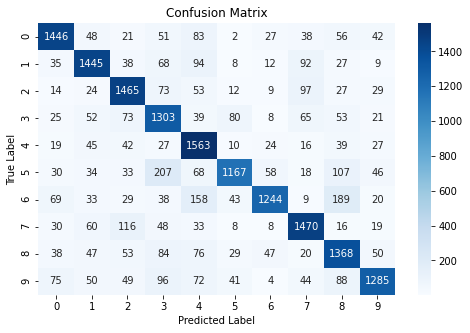

In [49]:
# Generate predictions from the trained model
predicted_labels = model_v2.predict(test_images)

# Convert probabilities to class labels
predicted_labels = np.argmax(predicted_labels, axis=-1)

# Convert actual labels from one-hot encoding to categorical values
actual_labels = np.argmax(test_labels, axis=-1)

# Import necessary evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# Display classification performance
print("Classification Report:\n", classification_report(actual_labels, predicted_labels))

# Create a confusion matrix
conf_matrix = confusion_matrix(actual_labels, predicted_labels)

# Visualizing the confusion matrix using a heatmap
plt.figure(figsize=(8, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix')
plt.show()

### D. Plot the training loss, validation loss vs number of epochs and training accuracy, validation accuracy vs number of epochs plot and write your observations on the same

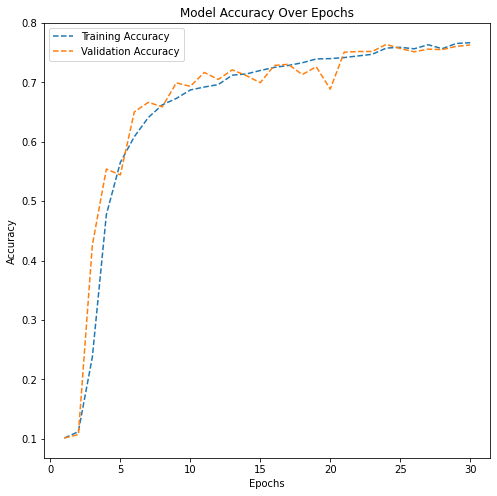

In [50]:
# Extract accuracy data from training history
training_history = history_v2.history
epochs_list = list(range(1, 31))

# Plot training and validation accuracy
plt.figure(figsize=(8, 8))
plt.plot(epochs_list, training_history['accuracy'], linestyle='--', label='Training Accuracy')
plt.plot(epochs_list, training_history['val_accuracy'], linestyle='--', label='Validation Accuracy')

# Add labels, legend, and title
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Over Epochs')
plt.legend()
plt.show()


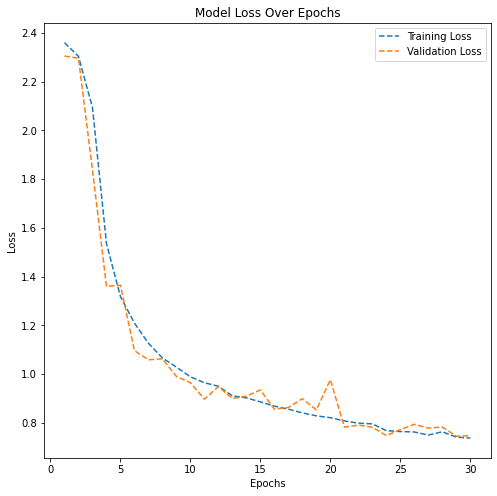

In [51]:
# Extract loss data from training history
training_history = history_v2.history
epochs_list = list(range(1, 31))

# Plot training and validation loss
plt.figure(figsize=(8, 8))
plt.plot(epochs_list, training_history['loss'], linestyle='--', label='Training Loss')
plt.plot(epochs_list, training_history['val_loss'], linestyle='--', label='Validation Loss')

# Add labels, legend, and title
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Model Loss Over Epochs')
plt.legend()
plt.show()

#### Results

- The model does not exhibit signs of overfitting, as training and validation accuracies remain closely aligned.
- Accuracy shows a rapid improvement during the initial 8 epochs, followed by a more gradual increase.
- Despite minor fluctuations, the overall accuracy trend is upward, indicating steady learning.
